# アミノ酸配列のグラフ表示画像のVision Transformerによるタンパク質ファミリー分類（5分割交差検証）
- データセット：`InterPro/GPCR`
- グラデーション適用
- クラスごとに分ける `StratifiedKFold` を採用
- ベースモデル：`google/vit-base-patch16-224-in21k`
- ハイパーパラメータ
    - バッチサイズ：$32$
    - エポック数：$10$
    - 学習率：$5 \times 10^{-5}$

## 1. ライブラリのインポート

In [1]:
from torch.utils.data import Dataset, Subset
from PIL import Image
import os
import pandas as pd
import numpy as np

from torchvision.transforms import Compose, Resize, ToTensor, Normalize
from transformers import ViTImageProcessorFast, ViTForImageClassification, ViTConfig, TrainingArguments, Trainer
from sklearn.model_selection import StratifiedKFold
from sklearn.metrics import classification_report, confusion_matrix, precision_score, recall_score, f1_score, ConfusionMatrixDisplay
import matplotlib.pyplot as plt
import evaluate

# ===========================
# 表示オプションの設定（省略防止）
# ===========================
pd.set_option('display.max_rows', None)
pd.set_option('display.max_columns', None)
pd.set_option('display.width', None)
pd.set_option('display.max_colwidth', None)

label2id = {
    "IPR000018": 0,
    "IPR000025": 1,
    "IPR000142": 2,
    "IPR000204": 3,
    "IPR000356": 4,
    "IPR000371": 5,
    "IPR000405": 6,
    "IPR000499": 7,
    "IPR000503": 8,
    "IPR000586": 9,
    "IPR000611": 10,
    "IPR000670": 11,
    "IPR000723": 12,
    "IPR000725": 13,
    "IPR000820": 14,
    "IPR000826": 15,
    "IPR000921": 16,
    "IPR000929": 17,
    "IPR000995": 18,
    "IPR001069": 19,
    "IPR001350": 20,
    "IPR001402": 21,
    "IPR001418": 22,
    "IPR001520": 23,
    "IPR001556": 24,
    "IPR001634": 25,
    "IPR001658": 26,
    "IPR001671": 27,
    "IPR001681": 28,
    "IPR001760": 29,
    "IPR001793": 30,
    "IPR001817": 31,
    "IPR001973": 32,
    "IPR002002": 33,
    "IPR002120": 34,
    "IPR002131": 35,
    "IPR002230": 36,
    "IPR002231": 37,
    "IPR002232": 38,
    "IPR002233": 39,
    "IPR002275": 40,
    "IPR002276": 41,
    "IPR002282": 42,
    "IPR002962": 43,
    "IPR003904": 44,
    "IPR003905": 45,
    "IPR003909": 46,
    "IPR003912": 47,
    "IPR003980": 48,
    "IPR003981": 49,
    "IPR003984": 50,
    "IPR004061": 51,
    "IPR004065": 52,
    "IPR004071": 53,
    "IPR005388": 54,
    "IPR005389": 55,
    "IPR005390": 56,
    "IPR005394": 57,
    "IPR005395": 58,
    "IPR005464": 59,
    "IPR005466": 60,
    "IPR008102": 61,
    "IPR008103": 62,
    "IPR008109": 63,
    "IPR008112": 64,
    "IPR008361": 65,
    "IPR008365": 66,
    "IPR009126": 67,
    "IPR009132": 68,
    "IPR009150": 69,
    "IPR013312": 70,
    "IPR022347": 71,
    "IPR026234": 72,
    "IPR027677": 73,
    "IPR028335": 74,
    "IPR028336": 75,
    "IPR037486": 76,
    "IPR039952": 77,
    "IPR042804": 78,
    "IPR047143": 79,
    "IPR047160": 80,
    "IPR048077": 81,
    "IPR049579": 82,
    "IPR050119": 83
}
id2label = {v: k for k, v in label2id.items()}

MODEL_NAME = "google/vit-base-patch16-224-in21k"
BATCH_SIZE = 32
EPOCHS = 10
LR = 5e-5
# WEIGHT_DECAY = 1e-4

## 1. 画像とラベルの対応を取る `Dataset` を作成

In [2]:
class GPCRImageDataset(Dataset):
    def __init__(self, csv_path, img_dir, transform=None):
        self.data = pd.read_csv(csv_path, header=None, names=["num", "label", "accession"])
        self.img_dir = img_dir
        self.transform = transform

    def __len__(self):
        return len(self.data)

    def __getitem__(self, idx):
        row = self.data.iloc[idx]
        img_path = os.path.join(self.img_dir, f"{row['num']}.png")
        image = Image.open(img_path).convert("RGB")
        label = label2id[row["label"]]

        if self.transform:
            image = self.transform(image)
        return {"pixel_values": image, "label": label}

## 2. 画像前処理（ViT用）

In [3]:
processor = ViTImageProcessorFast.from_pretrained(MODEL_NAME)
transform = Compose([
    Resize((224, 224)),
    ToTensor(),
    Normalize(mean=processor.image_mean, std=processor.image_std)
])

## 3. `Trainer` を使って学習

In [4]:
accuracy = evaluate.load("accuracy")
dataset = GPCRImageDataset("../../../data/interpro-labels.csv", "../../../graphs/interpro", transform=transform)

# StratifiedKFoldはラベル情報を使う
labels = dataset.data["label"].values
kfold = StratifiedKFold(n_splits=5, shuffle=True, random_state=42)

[Fold 1 / 5]


Some weights of ViTForImageClassification were not initialized from the model checkpoint at google/vit-base-patch16-224-in21k and are newly initialized: ['classifier.bias', 'classifier.weight']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.
/tmp/ipykernel_125309/353326631.py:52: FutureWarning: `tokenizer` is deprecated and will be removed in version 5.0.0 for `Trainer.__init__`. Use `processing_class` instead.
  trainer = Trainer(


Epoch,Training Loss,Validation Loss,Accuracy,Precision,Recall,F1
1,0.171800,0.166732,0.952385,0.912692,0.892035,0.898998
2,0.107700,0.128259,0.961697,0.921770,0.903426,0.910064
3,0.069800,0.116177,0.965474,0.927252,0.931291,0.926051
4,0.051900,0.114613,0.965996,0.921419,0.920097,0.916784
5,0.034200,0.120223,0.967564,0.923470,0.919497,0.918805
6,0.025300,0.120139,0.969607,0.918139,0.924274,0.918928
7,0.020200,0.124264,0.969738,0.933626,0.933797,0.928240
8,0.017100,0.127120,0.968609,0.936914,0.943385,0.937316
9,0.015400,0.126836,0.970141,0.921354,0.914757,0.915870
10,0.013100,0.129851,0.968740,0.928680,0.925910,0.926103


Accuracy: 0.9687 | Precision: 0.9287 | Recall: 0.9259 | F1: 0.9261
              precision    recall  f1-score      support
IPR000018      0.984733  0.941606  0.962687    137.00000
IPR000025      0.993432  0.975806  0.984540    620.00000
IPR000142      0.993506  1.000000  0.996743    153.00000
IPR000204      0.948357  0.909910  0.928736    222.00000
IPR000356      0.965217  0.982301  0.973684    113.00000
IPR000371      0.982906  0.982906  0.982906    117.00000
IPR000405      0.956316  0.952941  0.954626    850.00000
IPR000499      0.994949  0.980100  0.987469    603.00000
IPR000503      0.989247  0.968421  0.978723     95.00000
IPR000586      0.990185  0.976344  0.983216    930.00000
IPR000611      0.898952  0.924557  0.911575   2598.00000
IPR000670      0.994220  0.985673  0.989928    349.00000
IPR000723      0.996510  0.996510  0.996510    573.00000
IPR000725      0.994329  0.998524  0.996422  33190.00000
IPR000820      0.325581  0.388889  0.354430     36.00000
IPR000826      0.8318

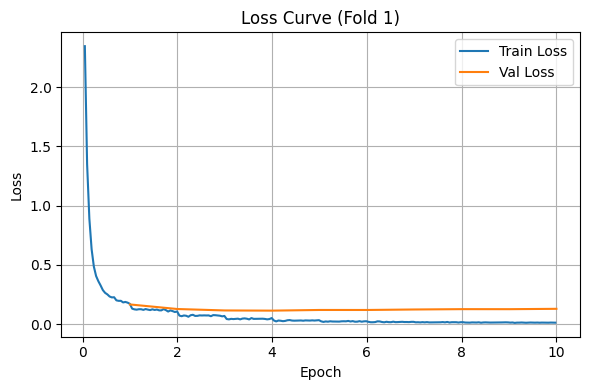

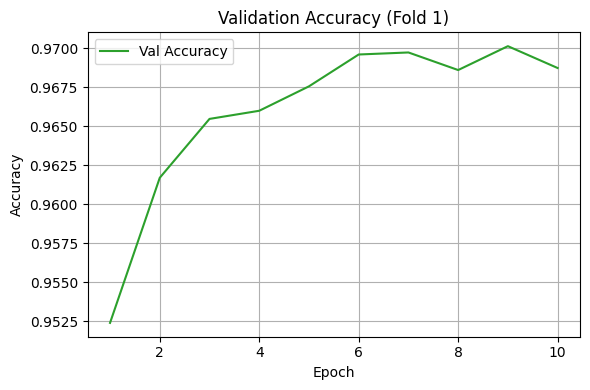

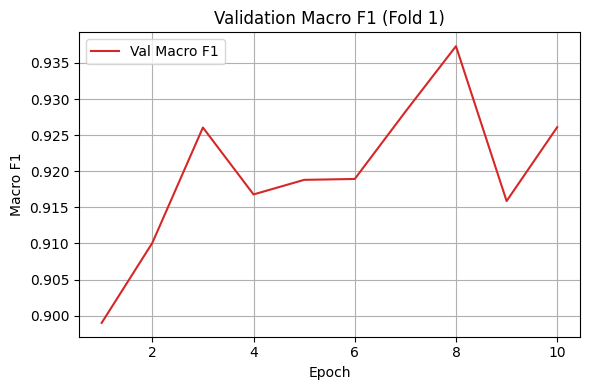

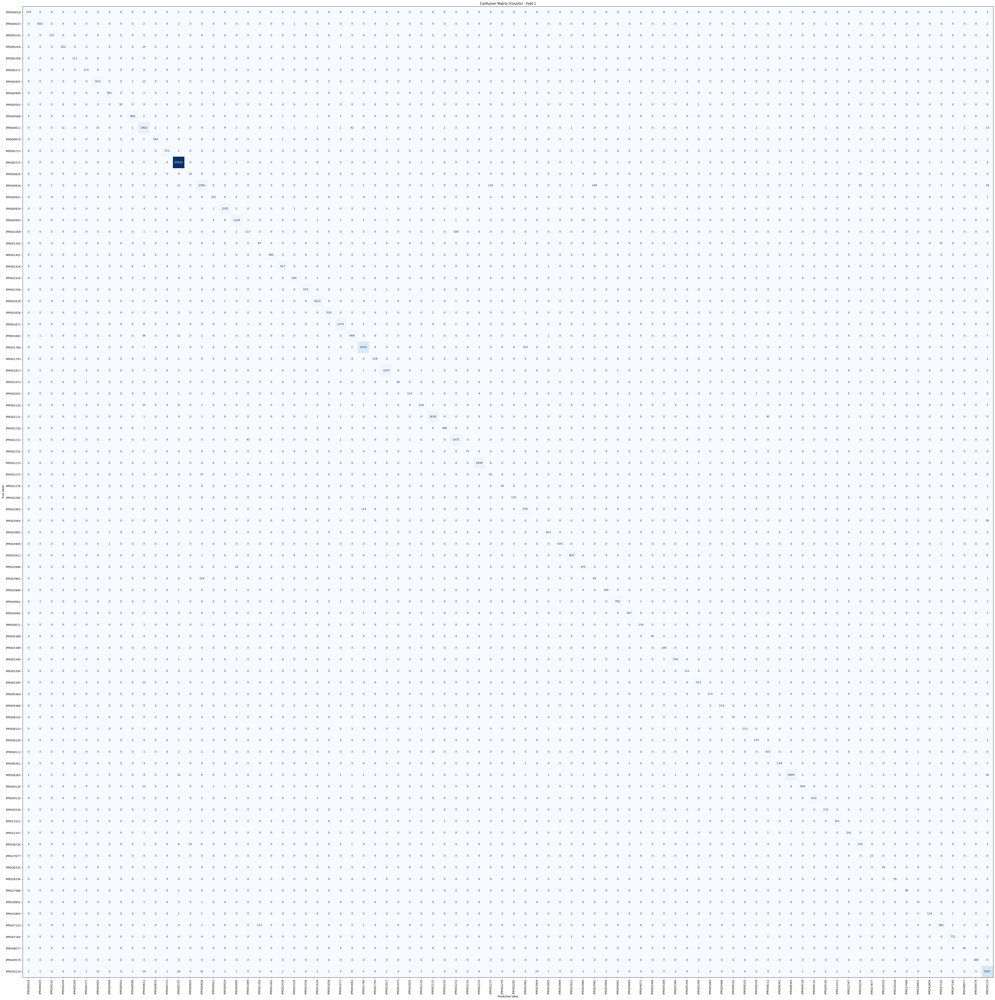

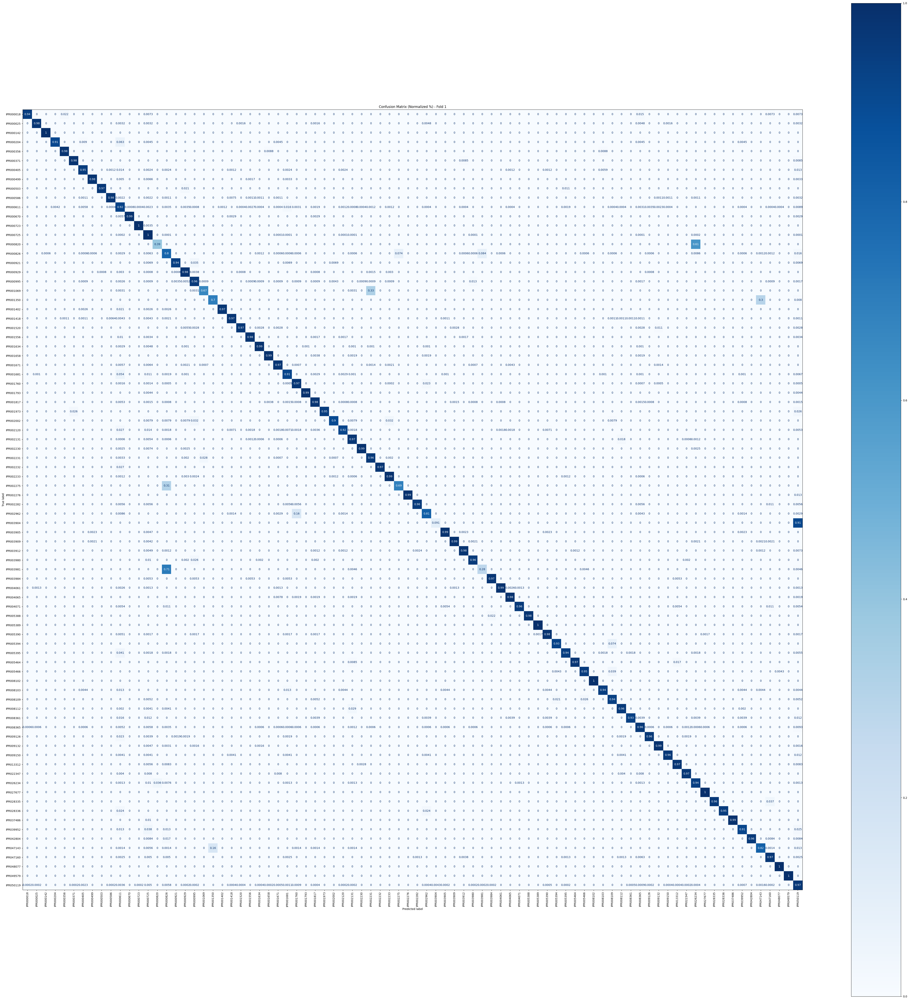

[Fold 2 / 5]


Some weights of ViTForImageClassification were not initialized from the model checkpoint at google/vit-base-patch16-224-in21k and are newly initialized: ['classifier.bias', 'classifier.weight']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.
/tmp/ipykernel_125309/353326631.py:52: FutureWarning: `tokenizer` is deprecated and will be removed in version 5.0.0 for `Trainer.__init__`. Use `processing_class` instead.
  trainer = Trainer(


Epoch,Training Loss,Validation Loss,Accuracy,Precision,Recall,F1
1,0.176700,0.176452,0.950247,0.905453,0.890975,0.892843
2,0.117400,0.134519,0.961186,0.904681,0.903906,0.901794
3,0.071600,0.113313,0.966198,0.923933,0.920903,0.920393
4,0.050700,0.123484,0.965806,0.924529,0.925125,0.921582
5,0.034400,0.114249,0.969440,0.923831,0.923519,0.918989
6,0.025600,0.121534,0.967908,0.927004,0.928333,0.925040
7,0.019800,0.132588,0.969512,0.924572,0.925496,0.922154
8,0.017500,0.134811,0.967968,0.926790,0.920990,0.921765
9,0.014300,0.131224,0.968918,0.924495,0.923072,0.921893
10,0.013600,0.133048,0.968633,0.919537,0.905252,0.911758


Accuracy: 0.9686 | Precision: 0.9195 | Recall: 0.9053 | F1: 0.9118
              precision    recall  f1-score       support
IPR000018      0.992647  0.985401  0.989011    137.000000
IPR000025      0.995114  0.985484  0.990276    620.000000
IPR000142      0.987097  1.000000  0.993506    153.000000
IPR000204      0.958140  0.927928  0.942792    222.000000
IPR000356      1.000000  0.982301  0.991071    113.000000
IPR000371      0.991228  0.974138  0.982609    116.000000
IPR000405      0.960000  0.930670  0.945107    851.000000
IPR000499      0.991681  0.988391  0.990033    603.000000
IPR000503      0.969388  1.000000  0.984456     95.000000
IPR000586      0.975532  0.986022  0.980749    930.000000
IPR000611      0.903860  0.937620  0.920431   2597.000000
IPR000670      0.997093  0.982808  0.989899    349.000000
IPR000723      0.998236  0.986063  0.992112    574.000000
IPR000725      0.994509  0.998674  0.996587  33189.000000
IPR000820      0.179487  0.189189  0.184211     37.000000
IPR00

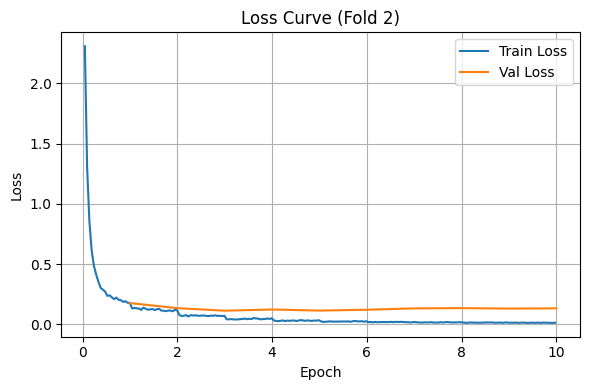

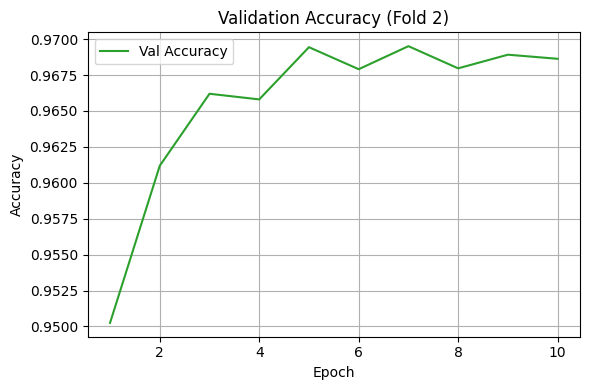

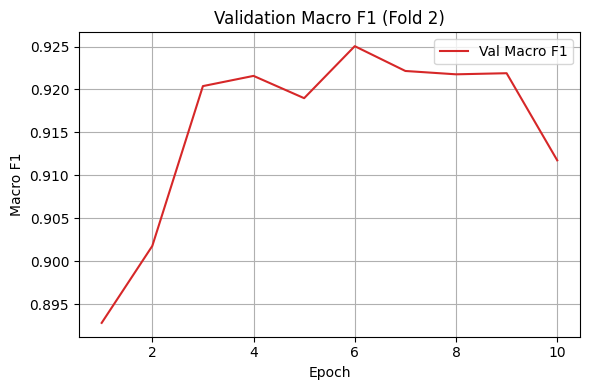

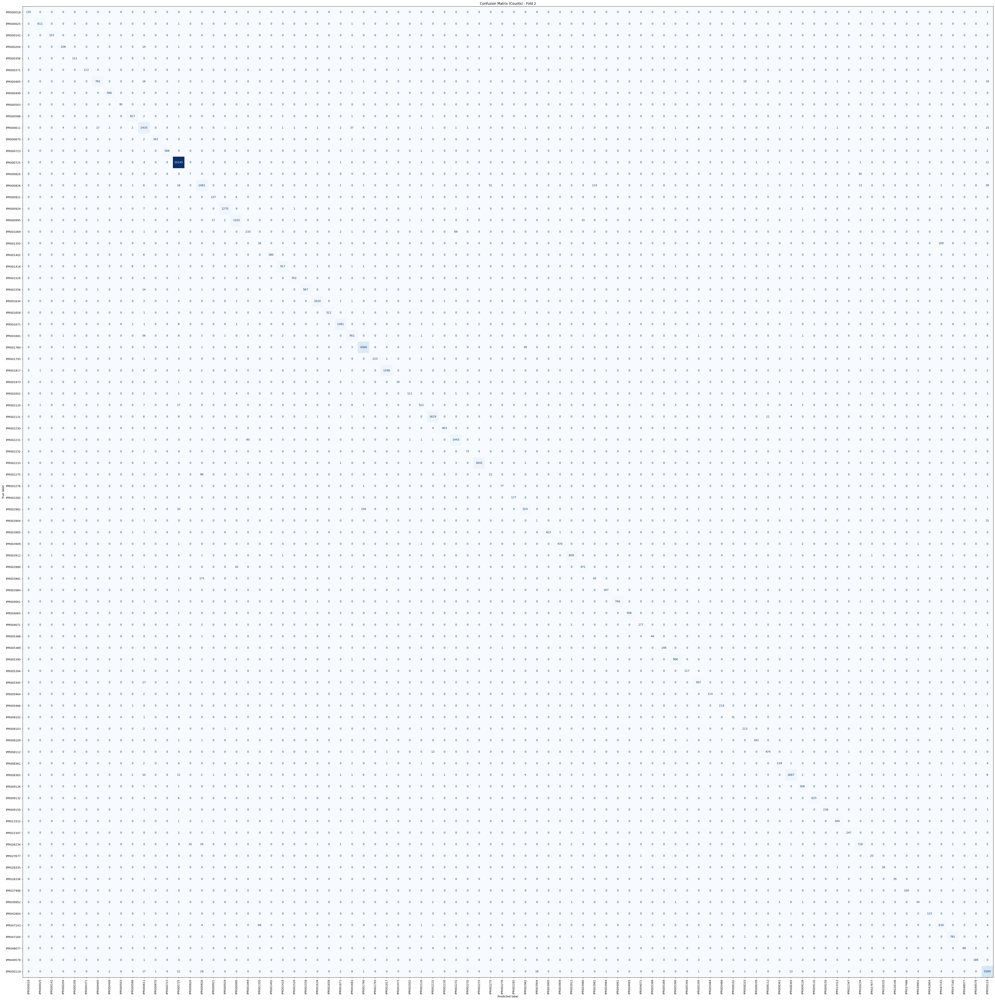

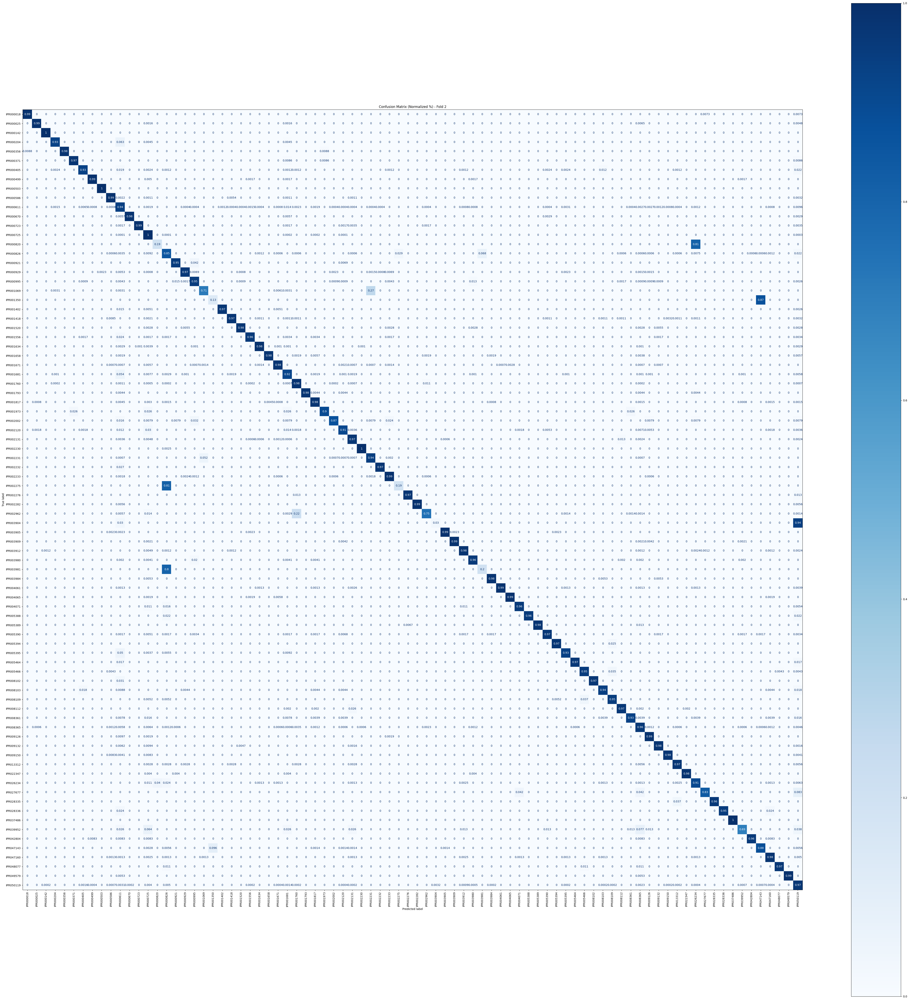

[Fold 3 / 5]


Some weights of ViTForImageClassification were not initialized from the model checkpoint at google/vit-base-patch16-224-in21k and are newly initialized: ['classifier.bias', 'classifier.weight']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.
/tmp/ipykernel_125309/353326631.py:52: FutureWarning: `tokenizer` is deprecated and will be removed in version 5.0.0 for `Trainer.__init__`. Use `processing_class` instead.
  trainer = Trainer(


Epoch,Training Loss,Validation Loss,Accuracy,Precision,Recall,F1
1,0.180000,0.164771,0.952611,0.924312,0.901582,0.907377
2,0.111800,0.125515,0.961803,0.917498,0.913291,0.909853
3,0.072000,0.115945,0.964773,0.933829,0.943414,0.934468
4,0.050000,0.118998,0.965521,0.931049,0.927526,0.925162
5,0.030400,0.113875,0.969037,0.930132,0.924471,0.919486
6,0.021900,0.118516,0.968977,0.930189,0.927805,0.923746
7,0.019800,0.120714,0.969025,0.917093,0.915794,0.914948
8,0.015000,0.124741,0.968633,0.930480,0.930212,0.928189
9,0.014000,0.130499,0.969191,0.926999,0.927756,0.925548
10,0.014100,0.130209,0.967932,0.924357,0.917238,0.919779


Accuracy: 0.9679 | Precision: 0.9244 | Recall: 0.9172 | F1: 0.9198
              precision    recall  f1-score       support
IPR000018      1.000000  0.985401  0.992647    137.000000
IPR000025      0.996759  0.991935  0.994341    620.000000
IPR000142      1.000000  0.986842  0.993377    152.000000
IPR000204      0.966184  0.900901  0.932401    222.000000
IPR000356      1.000000  0.982456  0.991150    114.000000
IPR000371      1.000000  0.991379  0.995671    116.000000
IPR000405      0.959330  0.942421  0.950800    851.000000
IPR000499      0.996622  0.980066  0.988275    602.000000
IPR000503      0.989474  0.979167  0.984293     96.000000
IPR000586      0.982851  0.987083  0.984962    929.000000
IPR000611      0.901325  0.942263  0.921340   2598.000000
IPR000670      1.000000  0.985673  0.992785    349.000000
IPR000723      0.998246  0.991289  0.994755    574.000000
IPR000725      0.994627  0.998403  0.996511  33189.000000
IPR000820      0.378788  0.675676  0.485437     37.000000
IPR00

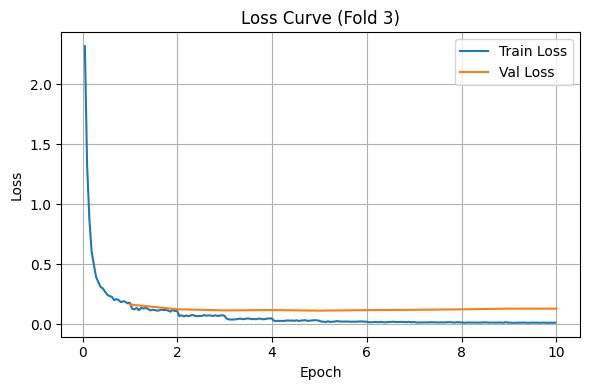

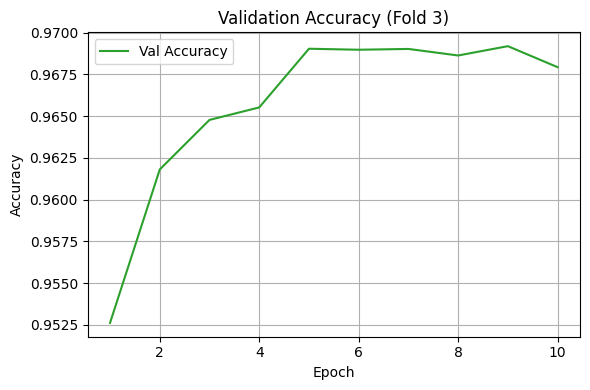

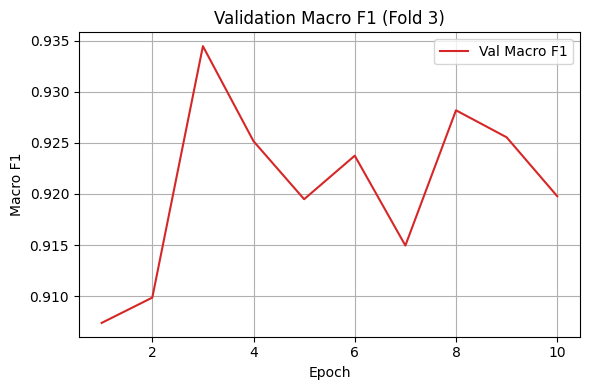

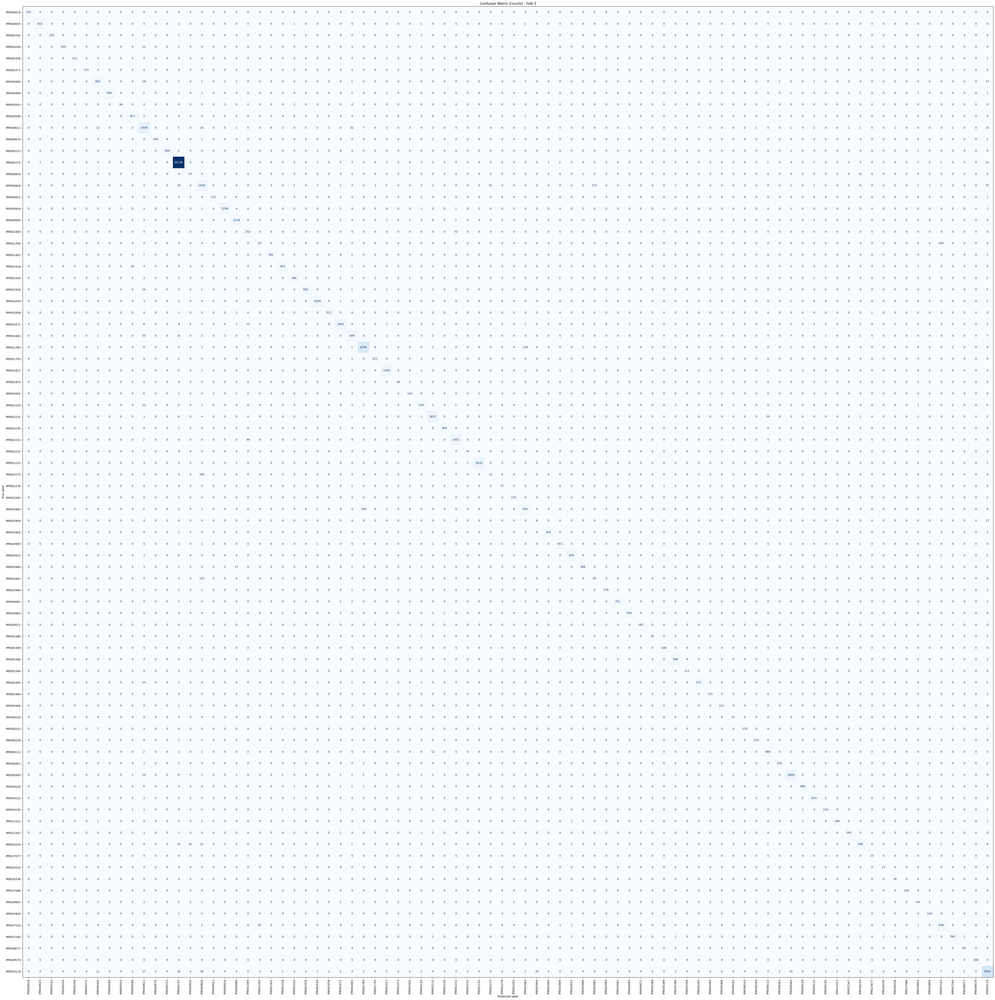

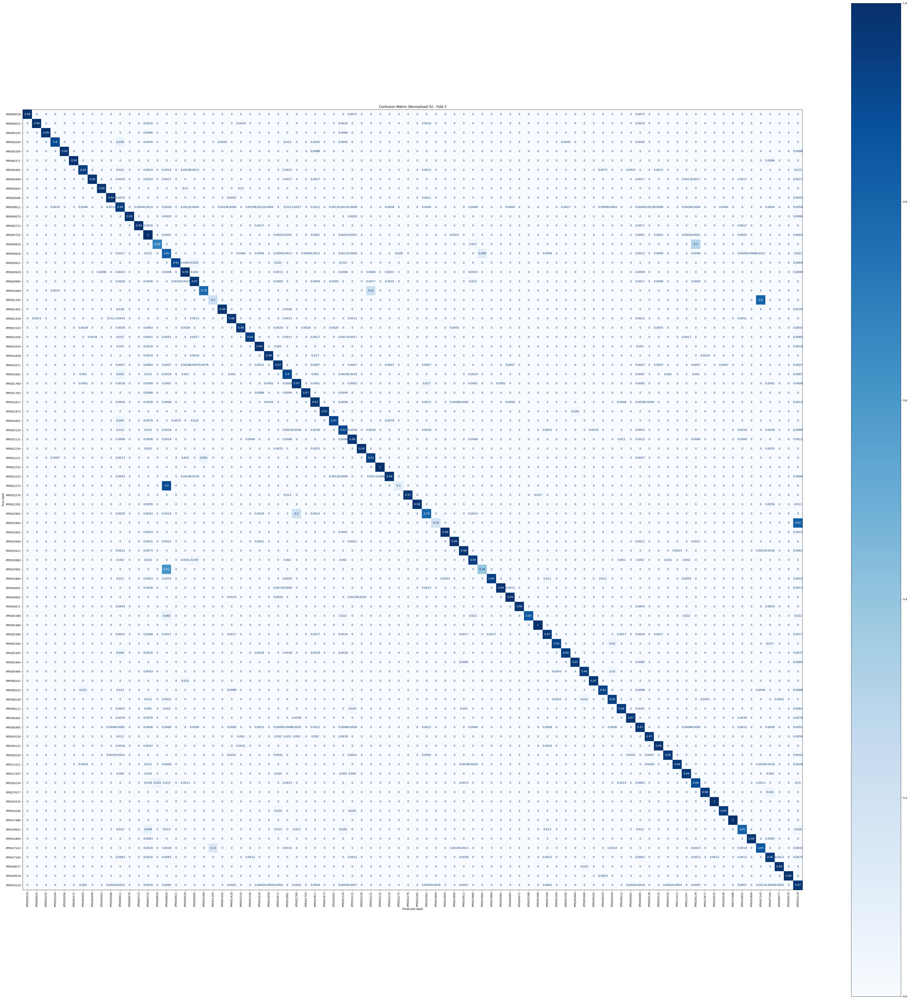

[Fold 4 / 5]


Some weights of ViTForImageClassification were not initialized from the model checkpoint at google/vit-base-patch16-224-in21k and are newly initialized: ['classifier.bias', 'classifier.weight']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.
/tmp/ipykernel_125309/353326631.py:52: FutureWarning: `tokenizer` is deprecated and will be removed in version 5.0.0 for `Trainer.__init__`. Use `processing_class` instead.
  trainer = Trainer(


Epoch,Training Loss,Validation Loss,Accuracy,Precision,Recall,F1
1,0.172000,0.164318,0.953299,0.914599,0.895554,0.899529
2,0.104700,0.133470,0.959998,0.932553,0.925073,0.924358
3,0.079700,0.112181,0.966091,0.922005,0.906174,0.911925
4,0.044600,0.112008,0.967956,0.924712,0.923439,0.922017
5,0.031300,0.117785,0.968502,0.924698,0.921114,0.917440
6,0.023800,0.125216,0.969084,0.924521,0.917839,0.919643
7,0.019700,0.124839,0.969619,0.919339,0.909131,0.912726
8,0.017900,0.125527,0.969500,0.917419,0.907364,0.912127
9,0.013900,0.127505,0.970771,0.926567,0.925133,0.923589
10,0.013800,0.125661,0.969250,0.922110,0.911765,0.916016


Accuracy: 0.9693 | Precision: 0.9221 | Recall: 0.9118 | F1: 0.9160
              precision    recall  f1-score      support
IPR000018      0.977273  0.941606  0.959108    137.00000
IPR000025      0.995122  0.987097  0.991093    620.00000
IPR000142      1.000000  0.993421  0.996700    152.00000
IPR000204      0.961538  0.900901  0.930233    222.00000
IPR000356      0.981982  0.956140  0.968889    114.00000
IPR000371      0.991304  0.982759  0.987013    116.00000
IPR000405      0.952324  0.938895  0.945562    851.00000
IPR000499      0.993344  0.991694  0.992519    602.00000
IPR000503      0.978723  0.958333  0.968421     96.00000
IPR000586      0.980645  0.981701  0.981173    929.00000
IPR000611      0.916761  0.932640  0.924633   2598.00000
IPR000670      0.994236  0.988539  0.991379    349.00000
IPR000723      0.996491  0.989547  0.993007    574.00000
IPR000725      0.995106  0.998554  0.996827  33189.00000
IPR000820      0.242424  0.216216  0.228571     37.00000
IPR000826      0.8026

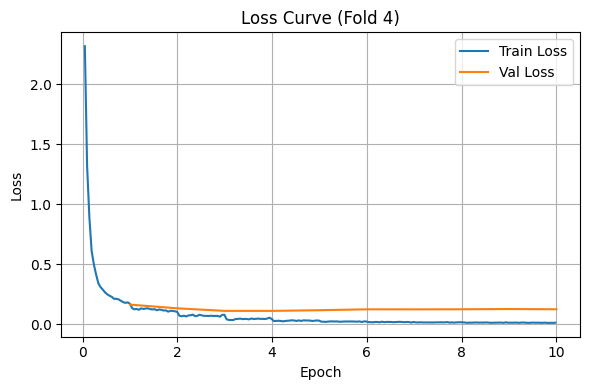

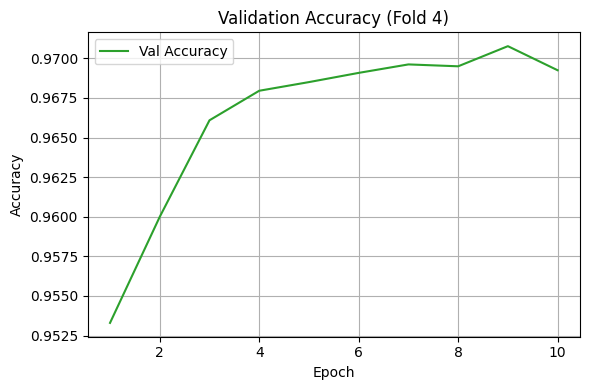

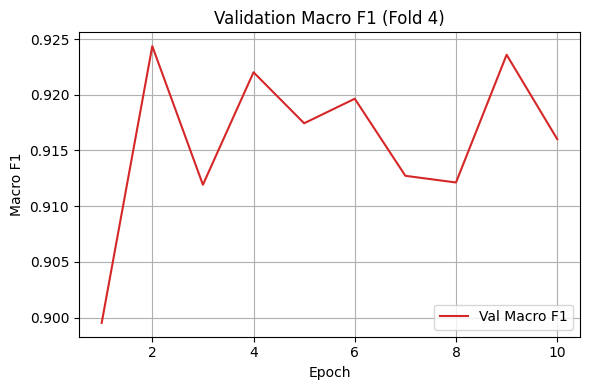

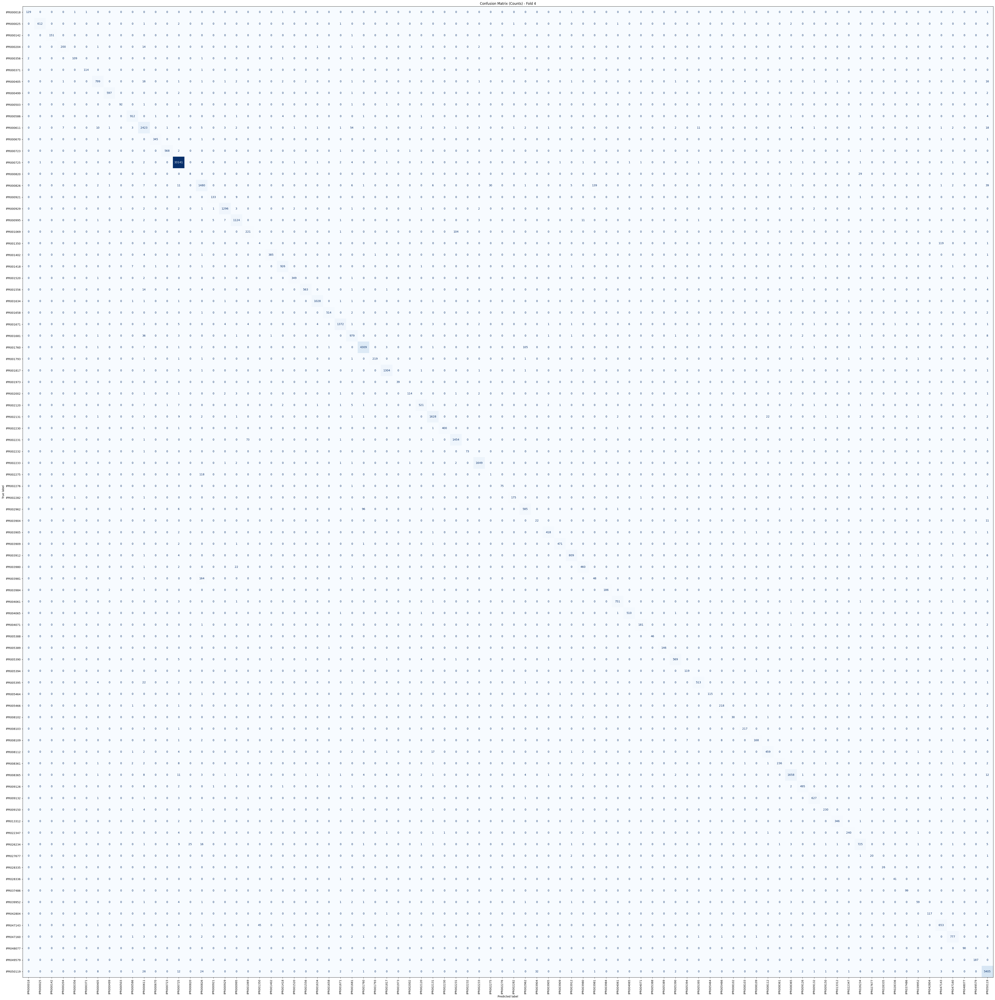

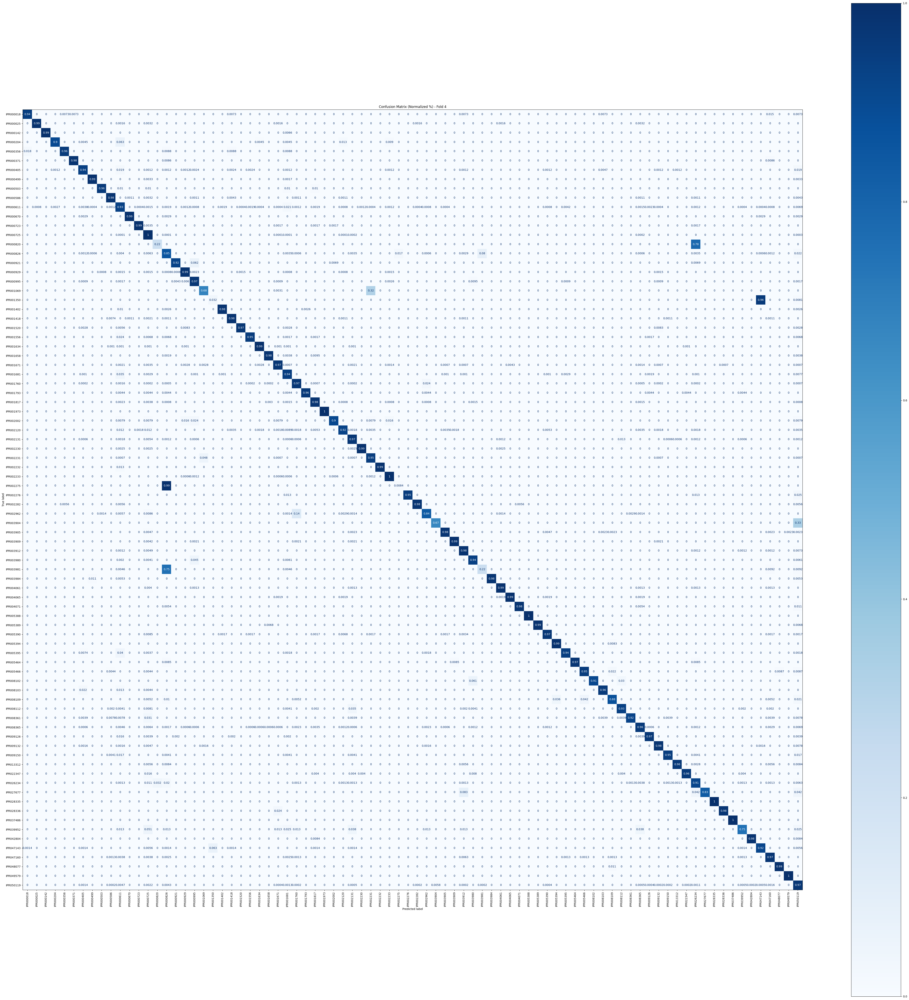

[Fold 5 / 5]


Some weights of ViTForImageClassification were not initialized from the model checkpoint at google/vit-base-patch16-224-in21k and are newly initialized: ['classifier.bias', 'classifier.weight']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.
/tmp/ipykernel_125309/353326631.py:52: FutureWarning: `tokenizer` is deprecated and will be removed in version 5.0.0 for `Trainer.__init__`. Use `processing_class` instead.
  trainer = Trainer(


Epoch,Training Loss,Validation Loss,Accuracy,Precision,Recall,F1
1,0.183000,0.167143,0.952147,0.912568,0.887894,0.892379
2,0.110500,0.123244,0.962326,0.914567,0.918124,0.912902
3,0.072000,0.111444,0.966317,0.910470,0.914274,0.910056
4,0.045300,0.116698,0.966875,0.931094,0.919542,0.922681
5,0.030200,0.121435,0.968086,0.925752,0.916098,0.918801
6,0.024400,0.118668,0.969238,0.928213,0.929685,0.926276
7,0.021900,0.122228,0.969844,0.932037,0.931592,0.929651
8,0.017600,0.120768,0.970367,0.919444,0.916691,0.916970
9,0.014200,0.117285,0.971697,0.925576,0.928966,0.923928
10,0.014400,0.121493,0.969868,0.921848,0.911342,0.916020


Accuracy: 0.9699 | Precision: 0.9218 | Recall: 0.9113 | F1: 0.9160
              precision    recall  f1-score       support
IPR000018      1.000000  0.970803  0.985185    137.000000
IPR000025      0.998355  0.980614  0.989405    619.000000
IPR000142      1.000000  0.993464  0.996721    153.000000
IPR000204      0.971831  0.932432  0.951724    222.000000
IPR000356      1.000000  0.991150  0.995556    113.000000
IPR000371      0.991379  0.982906  0.987124    117.000000
IPR000405      0.967509  0.944771  0.956005    851.000000
IPR000499      1.000000  0.976744  0.988235    602.000000
IPR000503      0.989583  0.989583  0.989583     96.000000
IPR000586      0.983940  0.989236  0.986581    929.000000
IPR000611      0.897568  0.937644  0.917169   2598.000000
IPR000670      0.991429  0.994269  0.992847    349.000000
IPR000723      1.000000  0.994764  0.997375    573.000000
IPR000725      0.995613  0.998343  0.996976  33190.000000
IPR000820      0.187500  0.081081  0.113208     37.000000
IPR00

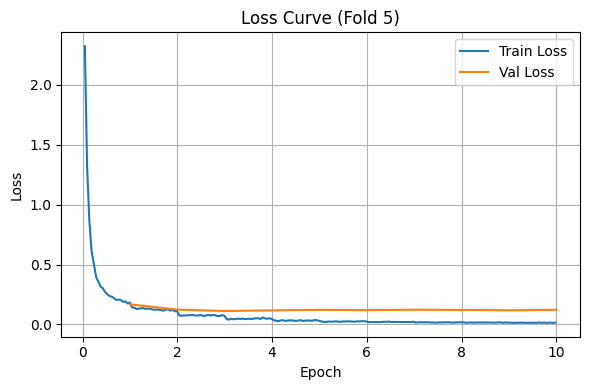

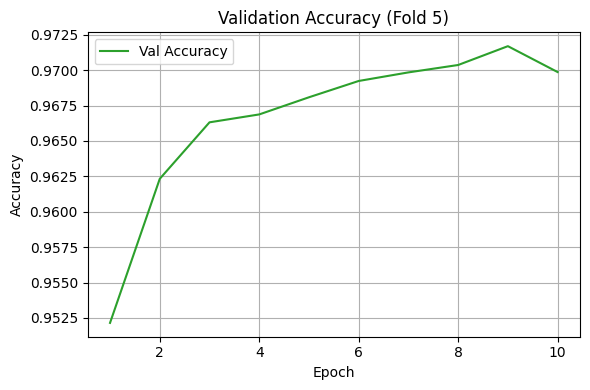

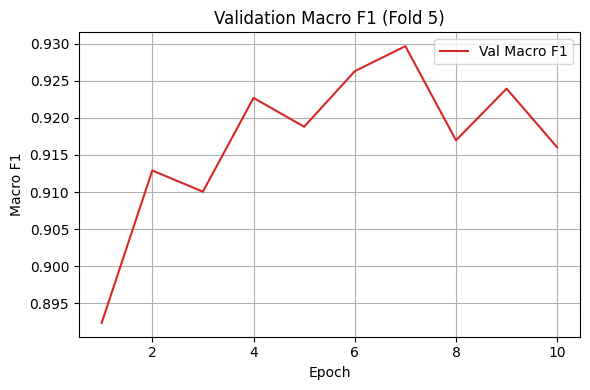

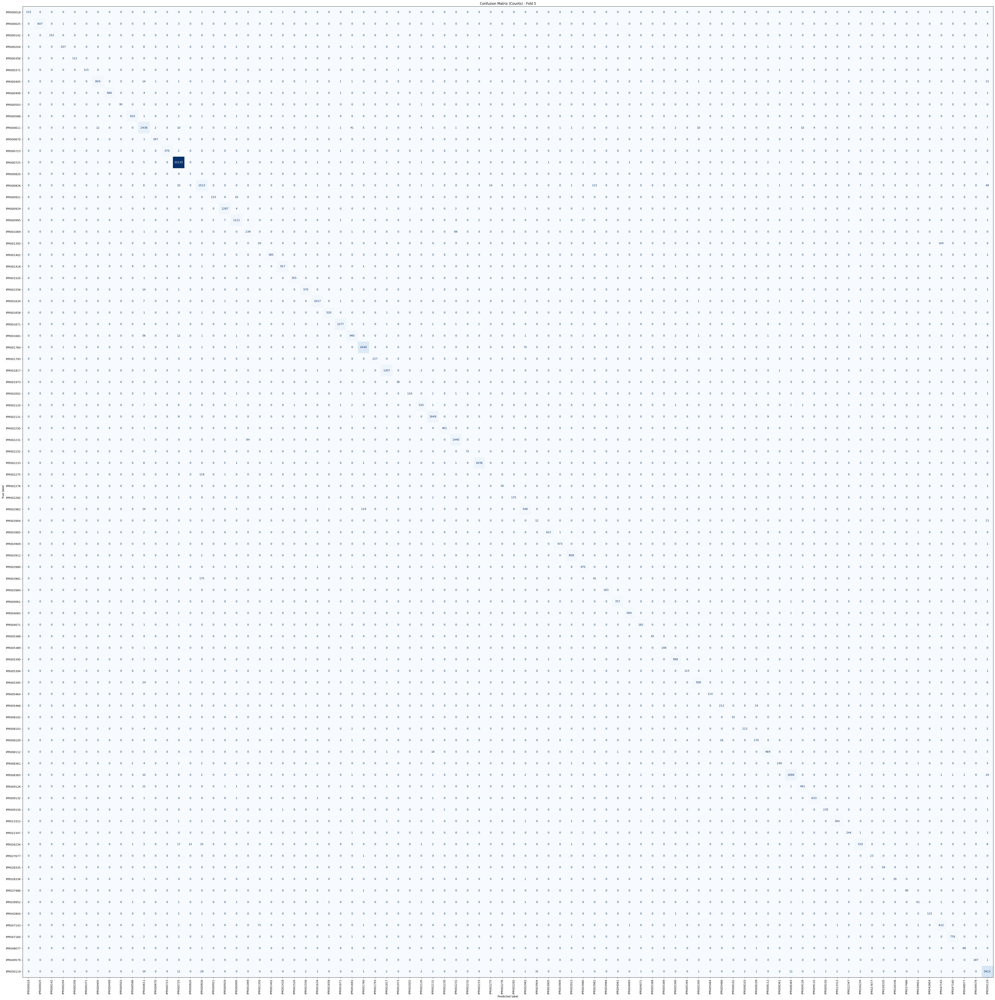

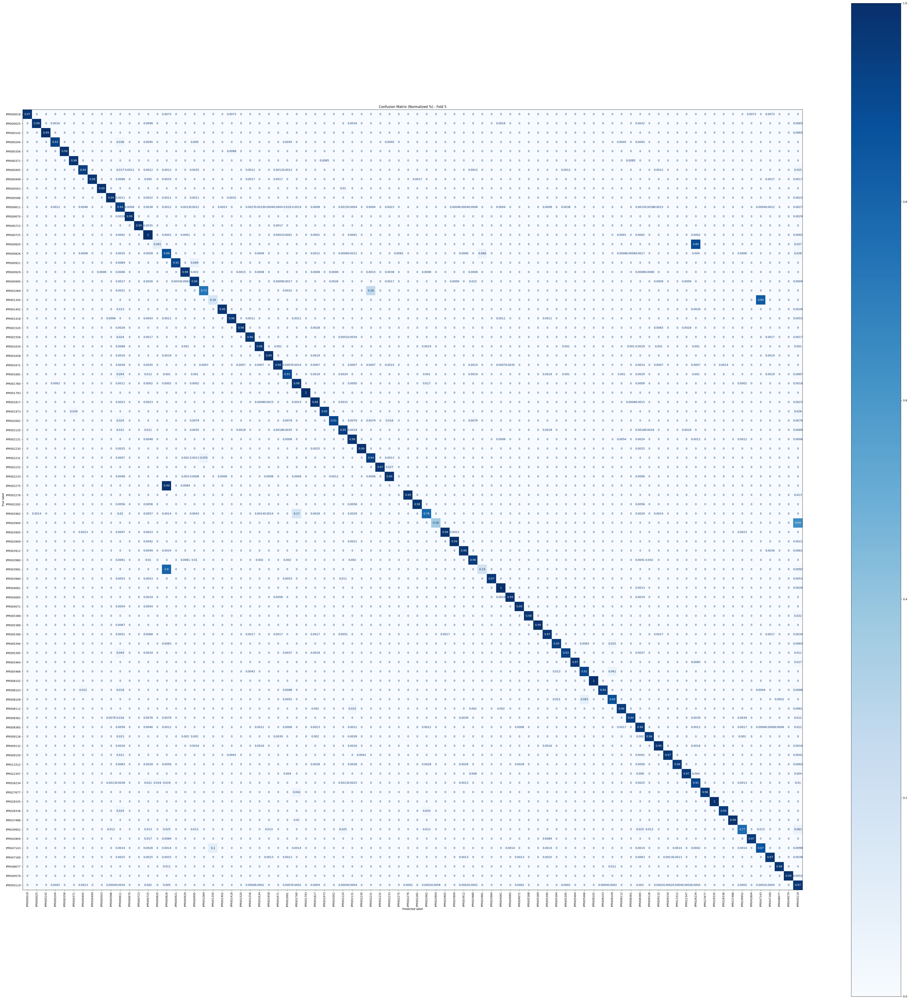

In [5]:
all_accs, all_pres, all_recs, all_f1s = [], [], [], []
all_class_f1s, all_conf_matrices = [], []
all_val_losses, all_val_accs, all_val_f1s = [], [], []

for fold, (train_idx, val_idx) in enumerate(kfold.split(np.zeros(len(labels)), labels)):
    print(f"\033[34m[Fold {fold+1} / 5]\033[0m")

    # Subset 作成
    train_dataset = Subset(dataset, train_idx)
    val_dataset = Subset(dataset, val_idx)

    # ======================
    # 4. モデル初期化
    # ======================
    model = ViTForImageClassification.from_pretrained(
        MODEL_NAME,
        num_labels=84,
        id2label=id2label,
        label2id=label2id
    )

    training_args = TrainingArguments(
        output_dir=f"../models/amino-classification-transformer-vit-interpro-stratified-kfold/batch-{BATCH_SIZE}-epoch-{EPOCHS}-lr-{LR}/{fold+1}",
        per_device_train_batch_size=BATCH_SIZE,
        per_device_eval_batch_size=BATCH_SIZE,
        eval_strategy="epoch",
        save_strategy="no",
        num_train_epochs=EPOCHS,
        logging_dir="./logs",
        report_to="none",
        learning_rate=LR,
        load_best_model_at_end=False,
        fp16=True,
        dataloader_num_workers=6
    )

    # ======================
    # 5. 評価指標
    # ======================
    def compute_metrics(eval_pred):
        logits, labels = eval_pred
        preds = np.argmax(logits, axis=-1)
        acc = accuracy.compute(predictions=preds, references=labels)["accuracy"]
        f1 = f1_score(labels, preds, average="macro")
        pre = precision_score(labels, preds, average="macro", zero_division=0)
        rec = recall_score(labels, preds, average="macro", zero_division=0)
        return {"accuracy": acc, "precision": pre, "recall": rec, "f1": f1}

    # ======================
    # 6. Trainer実行
    # ======================
    trainer = Trainer(
        model=model,
        args=training_args,
        train_dataset=train_dataset,
        eval_dataset=val_dataset,
        tokenizer=processor,
        compute_metrics=compute_metrics
    )

    trainer.train()

    # ==== ログから学習曲線抽出 ====
    log_history = pd.DataFrame(trainer.state.log_history)
    log_history = log_history.dropna(subset=["epoch"])
    train_loss = log_history[log_history["loss"].notna()][["epoch", "loss"]]
    eval_loss = log_history[log_history["eval_loss"].notna()][["epoch", "eval_loss", "eval_accuracy", "eval_f1"]]

    all_val_losses.append(eval_loss["eval_loss"].values)
    all_val_accs.append(eval_loss["eval_accuracy"].values)
    all_val_f1s.append(eval_loss["eval_f1"].values)

    # ======================
    # 7. 推論と評価
    # ======================
    preds = trainer.predict(val_dataset)
    y_true = preds.label_ids
    y_pred = np.argmax(preds.predictions, axis=1)

    acc = accuracy.compute(predictions=y_pred, references=y_true)["accuracy"]
    pre = precision_score(y_true, y_pred, average="macro", zero_division=0)
    rec = recall_score(y_true, y_pred, average="macro", zero_division=0)
    f1 = f1_score(y_true, y_pred, average="macro")
    cm = confusion_matrix(y_true, y_pred, labels=list(label2id.values()))

    report = classification_report(y_true, y_pred, target_names=list(label2id.keys()), output_dict=True)
    class_f1 = [report[c]["f1-score"] for c in list(label2id.keys())]

    # ==== 保存 ====
    all_accs.append(acc)
    all_pres.append(pre)
    all_recs.append(rec)
    all_f1s.append(f1)
    all_class_f1s.append(class_f1)
    all_conf_matrices.append(cm)

    # ==== 表示 ====
    print(f"\033[91mAccuracy: {acc:.4f}\033[0m | "
          f"\033[92mPrecision: {pre:.4f}\033[0m | "
          f"\033[93mRecall: {rec:.4f}\033[0m | "
          f"\033[94mF1: {f1:.4f}\033[0m")
    print(pd.DataFrame(report).T)

    # ==== foldごとの学習曲線を可視化 ====
    # --- Loss 曲線 ---
    plt.figure(figsize=(6, 4))
    plt.plot(train_loss["epoch"], train_loss["loss"], label="Train Loss", color="C0")
    plt.plot(eval_loss["epoch"], eval_loss["eval_loss"], label="Val Loss", color="C1")
    plt.xlabel("Epoch")
    plt.ylabel("Loss")
    plt.title(f"Loss Curve (Fold {fold+1})")
    plt.legend()
    plt.grid(True)
    plt.tight_layout()
    plt.show()

    # --- Accuracy 曲線 ---
    plt.figure(figsize=(6, 4))
    plt.plot(eval_loss["epoch"], eval_loss["eval_accuracy"], label="Val Accuracy", color="C2")
    plt.xlabel("Epoch")
    plt.ylabel("Accuracy")
    plt.title(f"Validation Accuracy (Fold {fold+1})")
    plt.legend()
    plt.grid(True)
    plt.tight_layout()
    plt.show()

    # --- Macro F1 曲線 ---
    plt.figure(figsize=(6, 4))
    plt.plot(eval_loss["epoch"], eval_loss["eval_f1"], label="Val Macro F1", color="C3")
    plt.xlabel("Epoch")
    plt.ylabel("Macro F1")
    plt.title(f"Validation Macro F1 (Fold {fold+1})")
    plt.legend()
    plt.grid(True)
    plt.tight_layout()
    plt.show()

    # クラス数を取得
    n_classes = len(label2id)
    
    # サイズスケーリング係数
    scale = 0.6
    figsize = (max(10, n_classes * scale), max(10, n_classes * scale))

    # --- 数値ベース混同行列 ---
    plt.figure(figsize=figsize)
    disp = ConfusionMatrixDisplay(confusion_matrix=cm, display_labels=list(label2id.keys()))
    disp.plot(cmap="Blues", xticks_rotation=90, ax=plt.gca(), colorbar=False)
    plt.title(f"Confusion Matrix (Counts) - Fold {fold+1}")
    plt.tight_layout()
    plt.show()
    
    # --- 割合ベース混同行列（行ごとに正規化） ---
    cm_normalized = cm.astype('float') / cm.sum(axis=1, keepdims=True)
    cm_normalized = np.nan_to_num(cm_normalized)  # NaN防止
    cm_normalized = np.round(cm_normalized, 4)
    
    plt.figure(figsize=figsize)
    disp_norm = ConfusionMatrixDisplay(confusion_matrix=cm_normalized, display_labels=list(label2id.keys()))
    disp_norm.plot(cmap="Blues", xticks_rotation=90, ax=plt.gca(), colorbar=True)
    plt.title(f"Confusion Matrix (Normalized %) - Fold {fold+1}")
    plt.tight_layout()
    plt.show()

## 4. 平均可視化

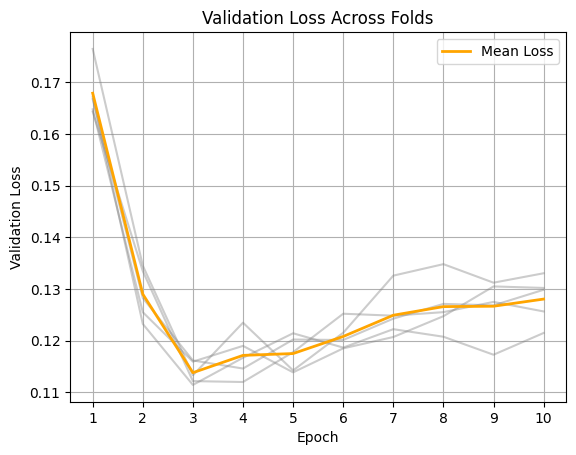

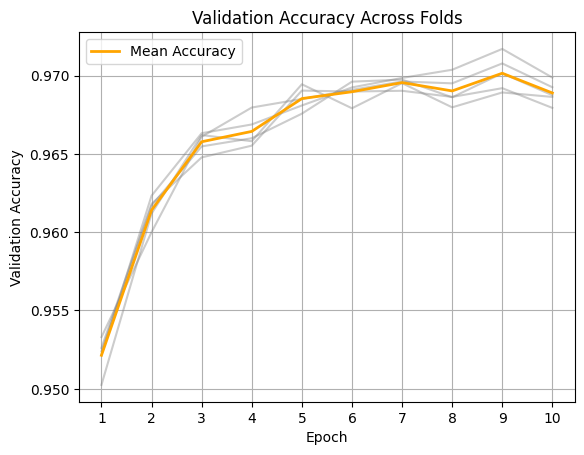

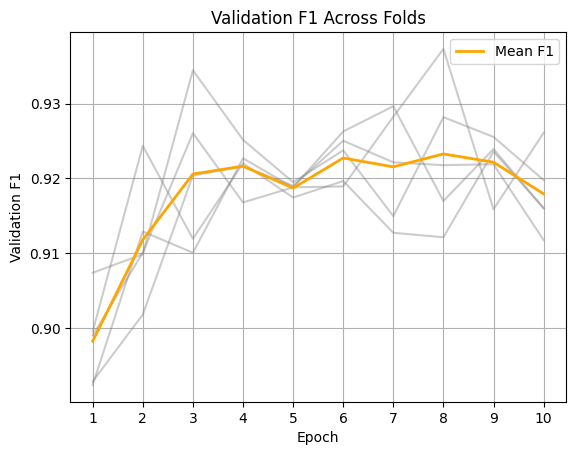

In [6]:
epochs = np.arange(1, EPOCHS + 1)

def interp_to_epochs(arr):
    arr = np.asarray(arr)
    orig_x = np.arange(1, len(arr) + 1)

    if len(arr) == 1:
        return np.full_like(epochs, arr[0], dtype=float)

    return np.interp(epochs, orig_x, arr)

def plot_mean_curves(all_vals, y_label, title, metric_name):
    interp_vals = []

    for v in all_vals:
        v_interp = interp_to_epochs(v)
        interp_vals.append(v_interp)
        plt.plot(epochs, v_interp, color="gray", alpha=0.4)

    interp_vals = np.vstack(interp_vals)
    mean_vals = interp_vals.mean(axis=0)

    plt.plot(epochs, mean_vals, color="orange", linewidth=2, label=f"Mean {metric_name}")
    plt.xlabel("Epoch"); plt.ylabel(y_label); plt.title(title)
    plt.xticks(epochs)
    plt.legend(); plt.grid(True)
    plt.show()

plot_mean_curves(all_val_losses, "Validation Loss", "Validation Loss Across Folds", "Loss")
plot_mean_curves(all_val_accs, "Validation Accuracy", "Validation Accuracy Across Folds", "Accuracy")
plot_mean_curves(all_val_f1s, "Validation F1", "Validation F1 Across Folds", "F1")

## 5. 総合評価


===== Average Across 5 Folds =====
Accuracy : 0.9689
Precision: 0.9233
Recall   : 0.9143
F1       : 0.9179

Per-Class F1 (Macro Average):
  IPR000018: 0.9777
  IPR000025: 0.9899
  IPR000142: 0.9954
  IPR000204: 0.9372
  IPR000356: 0.9841
  IPR000371: 0.9871
  IPR000405: 0.9504
  IPR000499: 0.9893
  IPR000503: 0.9811
  IPR000586: 0.9833
  IPR000611: 0.9190
  IPR000670: 0.9914
  IPR000723: 0.9948
  IPR000725: 0.9967
  IPR000820: 0.2732
  IPR000826: 0.8249
  IPR000921: 0.9347
  IPR000929: 0.9808
  IPR000995: 0.9624
  IPR001069: 0.7290
  IPR001350: 0.2260
  IPR001402: 0.9815
  IPR001418: 0.9823
  IPR001520: 0.9782
  IPR001556: 0.9692
  IPR001634: 0.9873
  IPR001658: 0.9847
  IPR001671: 0.9793
  IPR001681: 0.9184
  IPR001760: 0.9710
  IPR001793: 0.9889
  IPR001817: 0.9784
  IPR001973: 0.9682
  IPR002002: 0.9225
  IPR002120: 0.9379
  IPR002131: 0.9748
  IPR002230: 0.9926
  IPR002231: 0.9408
  IPR002232: 0.9865
  IPR002233: 0.9891
  IPR002275: 0.1747
  IPR002276: 0.9846
  IPR002282: 0.9836
 

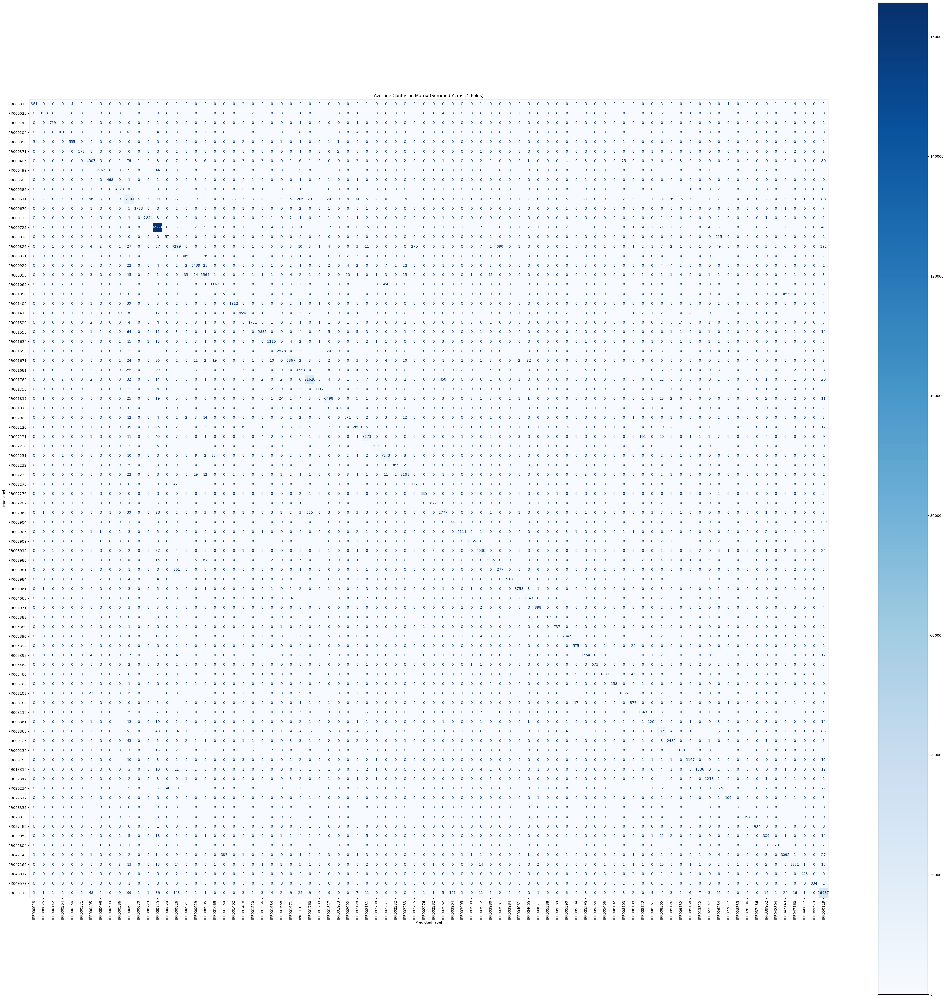

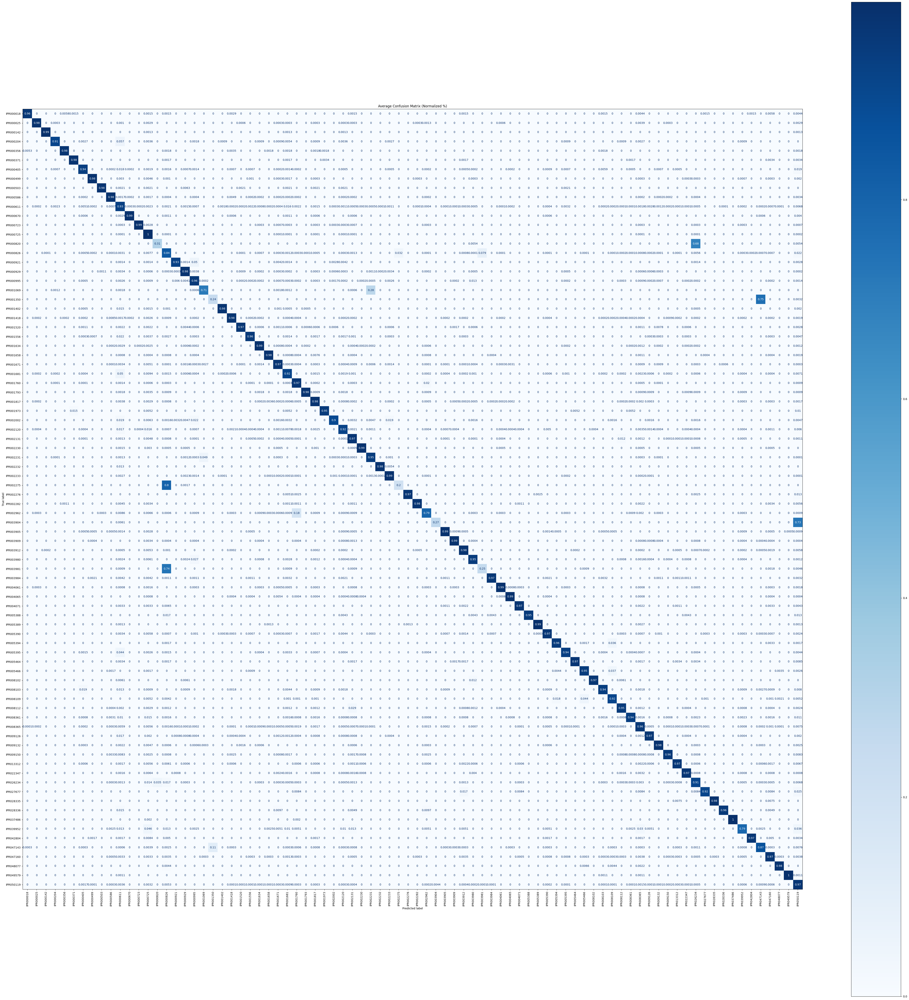

In [8]:
mean_acc = np.mean(all_accs)
mean_pre = np.mean(all_pres)
mean_rec = np.mean(all_recs)
mean_f1 = np.mean(all_f1s)
mean_class_f1 = np.mean(np.array(all_class_f1s), axis=0)

print("\n\033[36m===== Average Across 5 Folds =====\033[0m")
print(f"Accuracy : {mean_acc:.4f}")
print(f"Precision: {mean_pre:.4f}")
print(f"Recall   : {mean_rec:.4f}")
print(f"F1       : {mean_f1:.4f}\n")

print("Per-Class F1 (Macro Average):")
for cls, score in zip(label2id.keys(), mean_class_f1):
    print(f"  {cls}: {score:.4f}")

# ==== 混同行列平均表示 ====
mean_cm = np.sum(all_conf_matrices, axis=0)
plt.figure(figsize=figsize)
disp = ConfusionMatrixDisplay(confusion_matrix=mean_cm, display_labels=list(label2id.keys()))
disp.plot(cmap="Blues", xticks_rotation=90, ax=plt.gca(), colorbar=True)
plt.title("Average Confusion Matrix (Summed Across 5 Folds)")
plt.show()

# --- 割合ベース混同行列（行ごとに正規化） ---
mean_cm_normalized = mean_cm.astype('float') / mean_cm.sum(axis=1, keepdims=True)
mean_cm_normalized = np.nan_to_num(mean_cm_normalized)  # NaN防止
mean_cm_normalized = np.round(mean_cm_normalized, 4)

plt.figure(figsize=figsize)
disp_norm = ConfusionMatrixDisplay(confusion_matrix=mean_cm_normalized, display_labels=list(label2id.keys()))
disp_norm.plot(cmap="Blues", xticks_rotation=90, ax=plt.gca(), colorbar=True)
plt.title("Average Confusion Matrix (Normalized %)")
plt.tight_layout()
plt.show()